In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

from jax import config
config.update("jax_enable_x64", True)

In [2]:
import OTF, CNF, RealNVP, DatasetGenerator
import numpy as np
import pandas as pd
import optax
import matplotlib.pyplot as plt

from jax import jit, grad, value_and_grad, random
from flax.training import checkpoints

# plotting, move this to seperate notebook
from jax import vmap
import jax.numpy as jnp
from matplotlib import colormaps

2024-04-23 14:21:24.853646: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
EVAL_SOLVER_STEPS = 40

In [4]:
training_size = 10000
validation_size = 10000
test_size = 20000
spacing = 0

In [5]:
BATCH_SIZE_TR = training_size
BATCH_SIZE_VAL_TE = validation_size

In [6]:
PRECISION_PREFIX = 'float64'

In [7]:
offset = 0.3

In [8]:
key = random.PRNGKey(seed=42)
train, val, test = DatasetGenerator.make_tuc_letters(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
    spacing=0
)

plt_params_letters0 = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

[178.31521739 196.30434783]
[ 82.99951056 -68.55206513]


In [9]:
key = random.PRNGKey(seed=42)
train, val, test = DatasetGenerator.make_tuc_letters(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
    spacing=40
)

plt_params_letters40 = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

[241.83035714 196.96428571]
[117.68095653 -66.76414536]


In [10]:
key = random.PRNGKey(seed=42)
train, val, test = DatasetGenerator.make_checkerboard(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
)

plt_params_checkerboards = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

In [11]:
key = random.PRNGKey(seed=42)
train, val, test = DatasetGenerator.make_tuc_logo(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
)

plt_params_logo = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

# RealNVP

In [12]:
PRECISION_PREFIX = 'float64'
config.update("jax_enable_x64", True)

In [13]:
middle_RealNVP_letters0 = 'RealNVP_nol2_float64_letters-nospacing_32Bl'
middle_RealNVP_letters40 = 'RealNVP_nol2_float64_letters-spacing_32Bl'
middle_RealNVP_checkerboards = 'RealNVP_nol2_float64_checkerboards_32Bl'
middle_RealNVP_logo = 'RealNVP_nol2_float64_tuc-logo_8Bl'

In [14]:
params_RealVP_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [15]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)

res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], res), 
                     np.linspace(plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])


logpdf_realnvp_letters0, preimage_realnvp_letters0 = MODEL.log_pdf_and_preimage(xy, params_RealVP_letters0, True)

probs_realnvp_letters0 = jnp.exp(logpdf_realnvp_letters0)
y_realnvp_letters0 = MODEL.sample(5000, params=params_RealVP_letters0)

In [16]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], res), 
                     np.linspace(plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_realnvp_letters40, preimage_realnvp_letters40 = MODEL.log_pdf_and_preimage(xy, params_RealVP_letters40, True)

probs_realnvp_letters40 = jnp.exp(logpdf_realnvp_letters40)
y_realnvp_letters40 = MODEL.sample(5000, params=params_RealVP_letters40)

In [17]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], res), 
                     np.linspace(plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_realnvp_checkerboards, preimage_realnvp_checkerboards = MODEL.log_pdf_and_preimage(xy, params_RealVP_checkerboards, True)

probs_realnvp_checkerboards = jnp.exp(logpdf_realnvp_checkerboards)
y_realnvp_checkerboards = MODEL.sample(5000, params=params_RealVP_checkerboards)

In [18]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=8,
    key=key,
    input_dim=2,
    hidden_dim=64,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], res), 
                     np.linspace(plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_realnvp_logo, preimage_realnvp_logo = MODEL.log_pdf_and_preimage(xy, params_RealVP_logo, True)

probs_realnvp_logo = jnp.exp(logpdf_realnvp_logo)
y_realnvp_logo = MODEL.sample(5000, params=params_RealVP_logo)

# RealNVP L2

In [19]:
middle_RealNVP_l2_letters0 = 'RealNVP_l2_float64_letters-nospacing_8Bl'
middle_RealNVP_l2_letters40 = 'RealNVP_l2_float64_letters-spacing_32Bl'
middle_RealNVP_l2_checkerboards = 'RealNVP_l2_float64_checkerboards_32Bl'
middle_RealNVP_l2_logo = 'RealNVP_l2_float64_tuc-logo_12Bl'

In [20]:
params_RealVP_l2_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_l2_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_l2_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_l2_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [21]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=8,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)

res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], res), 
                     np.linspace(plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_realnvp_l2_letters0, preimage_realnvp_l2_letters0 = MODEL.log_pdf_and_preimage(xy, params_RealVP_l2_letters0, True)

probs_realnvp_l2_letters0 = jnp.exp(logpdf_realnvp_l2_letters0)
y_realnvp_l2_letters0 = MODEL.sample(5000, params=params_RealVP_l2_letters0)

In [22]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], res), 
                     np.linspace(plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_realnvp_l2_letters40, preimage_realnvp_l2_letters40 = MODEL.log_pdf_and_preimage(xy, params_RealVP_l2_letters40, True)

probs_realnvp_l2_letters40 = jnp.exp(logpdf_realnvp_l2_letters40)
y_realnvp_l2_letters40 = MODEL.sample(5000, params=params_RealVP_l2_letters40)

In [23]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], res), 
                     np.linspace(plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_realnvp_l2_checkerboards, preimage_realnvp_l2_checkerboards = MODEL.log_pdf_and_preimage(xy, params_RealVP_l2_checkerboards, True)

probs_realnvp_l2_checkerboards = jnp.exp(logpdf_realnvp_l2_checkerboards)
y_realnvp_l2_checkerboards = MODEL.sample(5000, params=params_RealVP_l2_checkerboards)

In [24]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=12,
    key=key,
    input_dim=2,
    hidden_dim=64,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], res), 
                     np.linspace(plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_realnvp_l2_logo, preimage_realnvp_l2_logo = MODEL.log_pdf_and_preimage(xy, params_RealVP_l2_logo, True)

probs_realnvp_l2_logo = jnp.exp(logpdf_realnvp_l2_logo)
y_realnvp_l2_logo = MODEL.sample(5000, params=params_RealVP_l2_logo)

# OTF 

In [25]:
middle_OTF_letters0 = 'OFT_float64_letters-nospacing_5pot'
middle_OTF_letters40 = 'OFT_float64_letters-spacing_5pot'
middle_OTF_checkerboards = 'OFT_float64_checkerboards_5pot'
middle_OTF_logo = 'OFT_float64_tuc-logo_10pot'

In [26]:
params_OTF_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_OTF_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_OTF_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_OTF_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [27]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=32,
        resnet_depth=2,
        rank=10,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=5,
        t0=0.,
        t1=1.,
        num_steps=20
)

res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], res), 
                     np.linspace(plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_otf_letters0, _, _, preimage_otf_letters0 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_OTF_letters0, True)

probs_otf_letters0 = jnp.exp(-logpdf_otf_letters0)
y_otf_letters0 = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_OTF_letters0)

In [28]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=32,
        resnet_depth=2,
        rank=10,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=5,
        t0=0.,
        t1=1.,
        num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], res), 
                     np.linspace(plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_otf_letters40, _, _, preimage_otf_letters40 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_OTF_letters40, True)

probs_otf_letters40 = jnp.exp(-logpdf_otf_letters40)
y_otf_letters40 = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_OTF_letters40)

In [29]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=32,
        resnet_depth=2,
        rank=10,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=5,
        t0=0.,
        t1=1.,
        num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], res), 
                     np.linspace(plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_otf_checkerboards, _, _, preimage_otf_checkerboards = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_OTF_checkerboards, True)

probs_otf_checkerboards = jnp.exp(-logpdf_otf_checkerboards)
y_otf_checkerboards = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_OTF_checkerboards)

In [30]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=64,
        resnet_depth=2,
        rank=20,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=10,
        t0=0.,
        t1=1.,
        num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], res), 
                     np.linspace(plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_otf_logo, _, _, preimage_otf_logo = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_OTF_logo, True)

probs_otf_logo = jnp.exp(-logpdf_otf_logo)
y_otf_logo = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_OTF_logo)

# CNF

In [31]:
config.update("jax_enable_x64", False)

In [32]:
middle_CNF_nol2_letters0 = 'CNF_nol2_float32_letters-nospacing_3VF'
middle_CNF_nol2_letters40 = 'CNF_nol2_float32_letters-spacing_5VF'
middle_CNF_nol2_checkerboards = 'CNF_nol2_float32_checkerboards_5VF'
middle_CNF_nol2_logo = 'CNF_nol2_float32_tuc-logo_10VF'

In [33]:
params_CNF_nol2_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_nol2_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_nol2_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_nol2_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [34]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=3,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)

res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], res), 
                     np.linspace(plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_nol2_letters0, preimage_cnf_nol2_letters0 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_nol2_letters0, True)

probs_cnf_nol2_letters0 = jnp.exp(logpdf_cnf_nol2_letters0)
y_cnf_nol2_letters0 = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_nol2_letters0)

In [35]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], res), 
                     np.linspace(plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_nol2_letters40, preimage_cnf_nol2_letters40 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_nol2_letters40, True)

probs_cnf_nol2_letters40 = jnp.exp(logpdf_cnf_nol2_letters40)
y_cnf_nol2_letters40 = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_nol2_letters40)

In [36]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], res), 
                     np.linspace(plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_nol2_checkerboards, preimage_cnf_nol2_checkerboards = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_nol2_checkerboards, True)

probs_cnf_nol2_checkerboards = jnp.exp(logpdf_cnf_nol2_checkerboards)
y_cnf_nol2_checkerboards = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_nol2_checkerboards)

In [37]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=64,
    out_dim=2,
    depth=3,
    num_blocks=10,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], res), 
                     np.linspace(plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_nol2_logo, preimage_cnf_nol2_logo = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_nol2_logo, True)

probs_cnf_nol2_logo = jnp.exp(logpdf_cnf_nol2_logo)
y_cnf_nol2_logo = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_nol2_logo)

# CNF L2

In [38]:
config.update("jax_enable_x64", False)

In [39]:
middle_CNF_l2_letters0 = 'CNF_l2_float32_letters-nospacing_5VF'
middle_CNF_l2_letters40 = 'CNF_l2_float32_letters-spacing_3VF'
middle_CNF_l2_checkerboards = 'CNF_l2_float32_checkerboards_5VF'
middle_CNF_l2_logo = 'CNF_l2_float32_tuc-logo_5VF'

In [40]:
params_CNF_l2_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_l2_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_l2_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_l2_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [41]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)

res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], res), 
                     np.linspace(plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_l2_letters0, preimage_cnf_l2_letters0 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_l2_letters0, True)

probs_cnf_l2_letters0 = jnp.exp(logpdf_cnf_l2_letters0)
y_cnf_l2_letters0 = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_l2_letters0)

In [42]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=3,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], res), 
                     np.linspace(plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_l2_letters40, preimage_cnf_l2_letters40 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_l2_letters40, True)

probs_cnf_l2_letters40 = jnp.exp(logpdf_cnf_l2_letters40)
y_cnf_l2_letters40 = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_l2_letters40)

In [43]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], res), 
                     np.linspace(plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_l2_checkerboards, preimage_cnf_l2_checkerboards = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_l2_checkerboards, True)

probs_cnf_l2_checkerboards = jnp.exp(logpdf_cnf_l2_checkerboards)
y_cnf_l2_checkerboards = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_l2_checkerboards)

In [44]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=64,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
res = 500
xx, yy = np.meshgrid(np.linspace(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], res), 
                     np.linspace(plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX'], res))
xy = np.hstack([e.reshape(-1, 1) for e in [xx, yy]])

logpdf_cnf_l2_logo, preimage_cnf_l2_logo = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(xy, EVAL_SOLVER_STEPS, params_CNF_l2_logo, True)

probs_cnf_l2_logo = jnp.exp(logpdf_cnf_l2_logo)
y_cnf_l2_logo = MODEL.sample(5000, EVAL_SOLVER_STEPS, params=params_CNF_l2_logo)

# Density plot

In [45]:
config.update("jax_enable_x64", True)

In [46]:
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['xtick.labelsize']= 15
plt.rcParams['ytick.labelsize']= 15

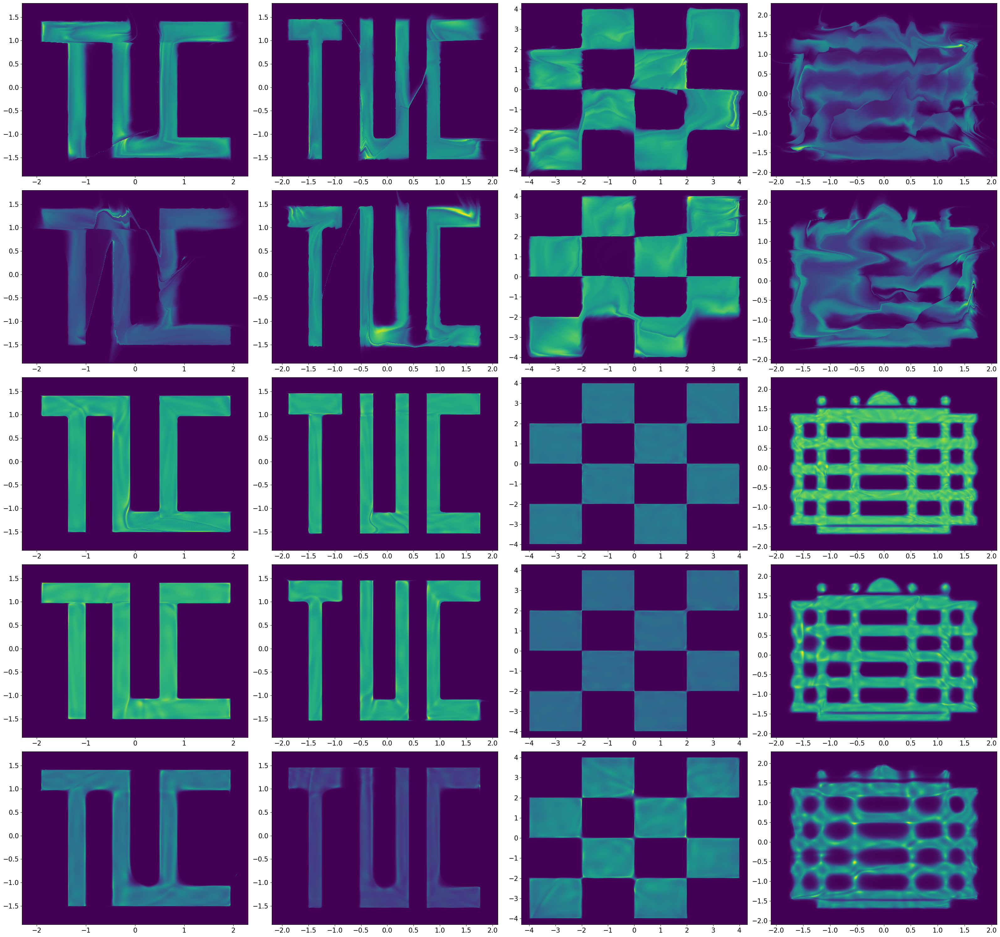

In [47]:
fig, ax = plt.subplots(5,4, figsize=(32,30))
ax[0, 0].imshow((probs_realnvp_letters0).reshape((res, res)),
           origin='lower', extent=(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], 
                                   plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']), aspect='auto')
# ax[0, 0].set_title('RealNVP, 32 Coupling Layers')
ax[0, 1].imshow((probs_realnvp_letters40).reshape((res, res)),
           origin='lower', extent=(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], 
                                   plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']), aspect='auto')
# ax[0, 1].set_title('RealNVP, 32 Coupling Layer')
ax[0, 2].imshow((probs_realnvp_checkerboards).reshape((res, res)),
           origin='lower', extent=(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], 
                                   plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']), aspect='auto')
# ax[0, 2].set_title('RealNVP, 32 Coupling Layers')
ax[0, 3].imshow((probs_realnvp_logo).reshape((res, res)),
           origin='lower', extent=(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], 
                                   plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']), aspect='auto')
# ax[0, 3].set_title('RealNVP, 8 Coupling Layers')


ax[1, 0].imshow((probs_realnvp_l2_letters0).reshape((res, res)),
           origin='lower', extent=(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], 
                                   plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']), aspect='auto')
# ax[1, 0].set_title('RealNVP $+ L_2$, 8 Coupling Layers')
ax[1, 1].imshow((probs_realnvp_l2_letters40).reshape((res, res)),
           origin='lower', extent=(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], 
                                   plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']), aspect='auto')
# ax[1, 1].set_title('RealNVP $+ L_2$, 32 Coupling Layers')
ax[1, 2].imshow((probs_realnvp_l2_checkerboards).reshape((res, res)),
           origin='lower', extent=(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], 
                                   plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']), aspect='auto')
# ax[1, 2].set_title('RealNVP $+ L_2$, 32 Coupling Layers')
ax[1, 3].imshow((probs_realnvp_l2_logo).reshape((res, res)),
           origin='lower', extent=(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], 
                                   plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']), aspect='auto')
# ax[1, 3].set_title('RealNVP $+ L_2$, 12 Coupling Layers')


ax[2, 0].imshow((probs_cnf_nol2_letters0).reshape((res, res)),
           origin='lower', extent=(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], 
                                   plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']), aspect='auto')
# ax[2, 0].set_title('CNF, 3 Vector Fields')
ax[2, 1].imshow((probs_cnf_nol2_letters40).reshape((res, res)),
           origin='lower', extent=(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], 
                                   plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']), aspect='auto')
# ax[2, 1].set_title('CNF, 5 Vector Fields')
ax[2, 2].imshow((probs_cnf_nol2_checkerboards).reshape((res, res)),
           origin='lower', extent=(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], 
                                   plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']), aspect='auto')
# ax[2, 2].set_title('CNF, 5 Vector Fields')
ax[2, 3].imshow((probs_cnf_nol2_logo).reshape((res, res)),
           origin='lower', extent=(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], 
                                   plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']), aspect='auto')
# ax[2, 3].set_title('CNF, 10 Vector Fields')

ax[3, 0].imshow((probs_cnf_l2_letters0).reshape((res, res)),
           origin='lower', extent=(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], 
                                   plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']), aspect='auto')
# ax[3, 0].set_title('CNF $+ L_2$, 5 Vector Fields')
ax[3, 1].imshow((probs_cnf_l2_letters40).reshape((res, res)),
           origin='lower', extent=(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], 
                                   plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']), aspect='auto')
# ax[3, 1].set_title('CNF $+ L_2$, 3 Vector Fields')
ax[3, 2].imshow((probs_cnf_l2_checkerboards).reshape((res, res)),
           origin='lower', extent=(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], 
                                   plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']), aspect='auto')
# ax[3, 2].set_title('CNF $+ L_2$, 5 Vector Fields')
ax[3, 3].imshow((probs_cnf_l2_logo).reshape((res, res)),
           origin='lower', extent=(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], 
                                   plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']), aspect='auto')
# ax[3, 3].set_title('CNF $+ L_2$, 5 Vector Fields')


ax[4, 0].imshow((probs_otf_letters0).reshape((res, res)),
           origin='lower', extent=(plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX'], 
                                   plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']), aspect='auto')
# ax[4, 0].set_title('OTF, 5 Potentials')
ax[4, 1].imshow((probs_otf_letters40).reshape((res, res)),
           origin='lower', extent=(plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX'], 
                                   plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']), aspect='auto')
# ax[4, 1].set_title('OTF, 5 Potentials')
ax[4, 2].imshow((probs_otf_checkerboards).reshape((res, res)),
           origin='lower', extent=(plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX'], 
                                   plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']), aspect='auto')
# ax[4, 2].set_title('OTF, 5 Potentials')
ax[4, 3].imshow((probs_otf_logo).reshape((res, res)),
           origin='lower', extent=(plt_params_logo['X_MIN'], plt_params_logo['X_MAX'], 
                                   plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']), aspect='auto')
# ax[4, 3].set_title('OTF, 10 Potentials')

# plt.setp(ax, xlabel='$x_1$ component', ylabel='$x_2$ component');
plt.tight_layout()

In [48]:
fig.savefig('best_models_density.png', bbox_inches='tight')

# Samples Plot

In [49]:
config.update("jax_enable_x64", True)

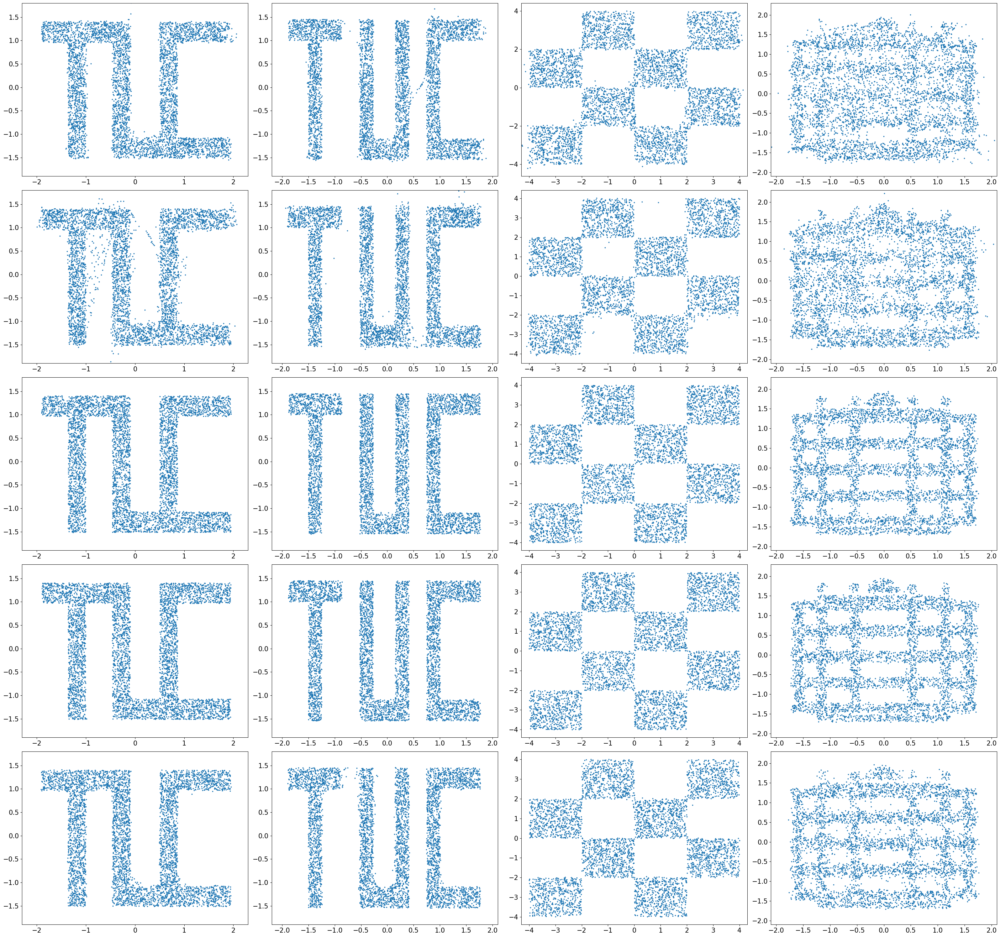

In [50]:
fig, ax = plt.subplots(5,4, figsize=(32,30))
ax[0, 0].scatter(*y_realnvp_letters0.T, s=3.)
ax[0, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
ax[0, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[0, 0].set_title('RealNVP, 32 Coupling Layers')
ax[0, 1].scatter(*y_realnvp_letters40.T, s=3.)
ax[0, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
ax[0, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[0, 1].set_title('RealNVP, 32 Coupling Layer')
ax[0, 2].scatter(*y_realnvp_checkerboards.T, s=3.)
ax[0, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
ax[0, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[0, 2].set_title('RealNVP, 32 Coupling Layers')
ax[0, 3].scatter(*y_realnvp_logo.T, s=3.)
ax[0, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
ax[0, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[0, 3].set_title('RealNVP, 8 Coupling Layers')


ax[1, 0].scatter(*y_realnvp_l2_letters0.T, s=3.)
ax[1, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
ax[1, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[1, 0].set_title('RealNVP $+ L_2$, 8 Coupling Layers')
ax[1, 1].scatter(*y_realnvp_l2_letters40.T, s=3.)
ax[1, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
ax[1, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[1, 1].set_title('RealNVP $+ L_2$, 32 Coupling Layers')
ax[1, 2].scatter(*y_realnvp_l2_checkerboards.T, s=3.)
ax[1, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
ax[1, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[1, 2].set_title('RealNVP $+ L_2$, 32 Coupling Layers')
ax[1, 3].scatter(*y_realnvp_l2_logo.T, s=3.)
ax[1, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
ax[1, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[1, 3].set_title('RealNVP $+ L_2$, 12 Coupling Layers')


ax[2, 0].scatter(*y_cnf_nol2_letters0.T, s=3.)
ax[2, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
ax[2, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[2, 0].set_title('CNF, 3 Vector Fields')
ax[2, 1].scatter(*y_cnf_nol2_letters40.T, s=3.)
ax[2, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
ax[2, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[2, 1].set_title('CNF, 5 Vector Fields')
ax[2, 2].scatter(*y_cnf_nol2_checkerboards.T, s=3.)
ax[2, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
ax[2, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[2, 2].set_title('CNF, 5 Vector Fields')
ax[2, 3].scatter(*y_cnf_nol2_logo.T, s=3.)
ax[2, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
ax[2, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[2, 3].set_title('CNF, 10 Vector Fields')

ax[3, 0].scatter(*y_cnf_l2_letters0.T, s=3.)
ax[3, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
ax[3, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[3, 0].set_title('CNF $+ L_2$, 5 Vector Fields')
ax[3, 1].scatter(*y_cnf_l2_letters40.T, s=3.)
ax[3, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
ax[3, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[3, 1].set_title('CNF $+ L_2$, 3 Vector Fields')
ax[3, 2].scatter(*y_cnf_l2_checkerboards.T, s=3.)
ax[3, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
ax[3, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[3, 2].set_title('CNF $+ L_2$, 5 Vector Fields')
ax[3, 3].scatter(*y_cnf_l2_logo.T, s=3.)
ax[3, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
ax[3, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[3, 3].set_title('CNF $+ L_2$, 5 Vector Fields')


ax[4, 0].scatter(*y_otf_letters0.T, s=3.)
ax[4, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
ax[4, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[4, 0].set_title('OTF, 5 Potentials')
ax[4, 1].scatter(*y_otf_letters40.T, s=3.)
ax[4, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
ax[4, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[4, 1].set_title('OTF, 5 Potentials')
ax[4, 2].scatter(*y_otf_checkerboards.T, s=3.)
ax[4, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
ax[4, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[4, 2].set_title('OTF, 5 Potentials')
ax[4, 3].scatter(*y_otf_logo.T, s=3.)
ax[4, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
ax[4, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[4, 3].set_title('OTF, 10 Potentials')

#plt.setp(ax, xlabel='$x_1$ component', ylabel='$x_2$ component');
plt.tight_layout()

In [51]:
fig.savefig('best_models_sample.png', bbox_inches='tight')

# Preimages Plot

We want to compute the preimages of the test-set

In [89]:
EVAL_SOLVER_STEPS = 20

In [90]:
key = random.PRNGKey(seed=42)
train, val, test_letters0 = DatasetGenerator.make_tuc_letters(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
    spacing=0
)

plt_params_letters0 = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

[178.31521739 196.30434783]
[ 82.99951056 -68.55206513]


In [91]:
key = random.PRNGKey(seed=42)
train, val, test_letters40 = DatasetGenerator.make_tuc_letters(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
    spacing=40
)

plt_params_letters40 = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

[241.83035714 196.96428571]
[117.68095653 -66.76414536]


In [92]:
key = random.PRNGKey(seed=42)
train, val, test_checkerboard = DatasetGenerator.make_checkerboard(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
)

plt_params_checkerboards = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

In [93]:
key = random.PRNGKey(seed=42)
train, val, test_logo = DatasetGenerator.make_tuc_logo(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
)

plt_params_logo = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

## RealNVP

In [94]:
PRECISION_PREFIX = 'float64'
config.update("jax_enable_x64", True)

In [95]:
middle_RealNVP_letters0 = 'RealNVP_nol2_float64_letters-nospacing_32Bl'
middle_RealNVP_letters40 = 'RealNVP_nol2_float64_letters-spacing_32Bl'
middle_RealNVP_checkerboards = 'RealNVP_nol2_float64_checkerboards_32Bl'
middle_RealNVP_logo = 'RealNVP_nol2_float64_tuc-logo_8Bl'

In [96]:
params_RealVP_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [97]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_letters0, preimage_realnvp_letters0 = MODEL.log_pdf_and_preimage(test_letters0, params_RealVP_letters0, True)

In [98]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_letters40, preimage_realnvp_letters40 = MODEL.log_pdf_and_preimage(test_letters40, params_RealVP_letters40, True)

In [99]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_checkerboards, preimage_realnvp_checkerboards = MODEL.log_pdf_and_preimage(test_checkerboard, params_RealVP_checkerboards, True)

In [100]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=8,
    key=key,
    input_dim=2,
    hidden_dim=64,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_logo, preimage_realnvp_logo = MODEL.log_pdf_and_preimage(test_logo, params_RealVP_logo, True)

## RealNVP L2

In [101]:
middle_RealNVP_l2_letters0 = 'RealNVP_l2_float64_letters-nospacing_8Bl'
middle_RealNVP_l2_letters40 = 'RealNVP_l2_float64_letters-spacing_32Bl'
middle_RealNVP_l2_checkerboards = 'RealNVP_l2_float64_checkerboards_32Bl'
middle_RealNVP_l2_logo = 'RealNVP_l2_float64_tuc-logo_12Bl'

In [102]:
params_RealVP_l2_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_l2_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_l2_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_RealVP_l2_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_RealNVP_l2_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [103]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=8,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_l2_letters0, preimage_realnvp_l2_letters0 = MODEL.log_pdf_and_preimage(test_letters0, params_RealVP_l2_letters0, True)

In [104]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_l2_letters40, preimage_realnvp_l2_letters40 = MODEL.log_pdf_and_preimage(test_letters40, params_RealVP_l2_letters40, True)

In [105]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=32,
    key=key,
    input_dim=2,
    hidden_dim=32,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_l2_checkerboards, preimage_realnvp_l2_checkerboards = MODEL.log_pdf_and_preimage(test_checkerboard, params_RealVP_l2_checkerboards, True)

In [106]:
MODEL = RealNVP.RealNVP(
    NVP_net=RealNVP.NVP_l,
    num_blocks=12,
    key=key,
    input_dim=2,
    hidden_dim=64,
    prior_type='gaussian',
    prior_args=None,
    use_dropout=False,
    dropout_proba=None
)
logpdf_realnvp_l2_logo, preimage_realnvp_l2_logo = MODEL.log_pdf_and_preimage(test_logo, params_RealVP_l2_logo, True)

## OTF 

In [107]:
middle_OTF_letters0 = 'OFT_float64_letters-nospacing_5pot'
middle_OTF_letters40 = 'OFT_float64_letters-spacing_5pot'
middle_OTF_checkerboards = 'OFT_float64_checkerboards_5pot'
middle_OTF_logo = 'OFT_float64_tuc-logo_10pot'

In [108]:
params_OTF_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_OTF_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_OTF_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_OTF_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_OTF_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [109]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=32,
        resnet_depth=2,
        rank=10,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=5,
        t0=0.,
        t1=1.,
        num_steps=20
)
logpdf_otf_letters0, _, _, preimage_otf_letters0 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_letters0, EVAL_SOLVER_STEPS, params_OTF_letters0, True)

In [110]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=32,
        resnet_depth=2,
        rank=10,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=5,
        t0=0.,
        t1=1.,
        num_steps=20
)
logpdf_otf_letters40, _, _, preimage_otf_letters40 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_letters40, EVAL_SOLVER_STEPS, params_OTF_letters40, True)

In [111]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=32,
        resnet_depth=2,
        rank=10,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=5,
        t0=0.,
        t1=1.,
        num_steps=20
)
logpdf_otf_checkerboards, _, _, preimage_otf_checkerboards = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_checkerboard, EVAL_SOLVER_STEPS, params_OTF_checkerboards, True)

In [112]:
MODEL = OTF.OTF(
        input_dim=2, 
        hidden_dim=64,
        resnet_depth=2,
        rank=20,
        key=key, 
        phi=OTF.Phi,
        alpha1=15.,
        alpha2=2.,
        num_blocks=10,
        t0=0.,
        t1=1.,
        num_steps=20
)
logpdf_otf_logo, _, _, preimage_otf_logo = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_logo, EVAL_SOLVER_STEPS, params_OTF_logo, True)

## CNF

In [113]:
config.update("jax_enable_x64", False)

In [114]:
key = random.PRNGKey(seed=42)
train, val, test_letters0 = DatasetGenerator.make_tuc_letters(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
    spacing=0
)

plt_params_letters0 = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

[178.31522 196.30434]
[ 82.99953 -68.5521 ]


In [115]:
key = random.PRNGKey(seed=42)
train, val, test_letters40 = DatasetGenerator.make_tuc_letters(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
    spacing=40
)

plt_params_letters40 = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

[241.83035 196.96428]
[117.68096 -66.76416]


In [116]:
key = random.PRNGKey(seed=42)
train, val, test_checkerboard = DatasetGenerator.make_checkerboard(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
)

plt_params_checkerboards = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

In [117]:
key = random.PRNGKey(seed=42)
train, val, test_logo = DatasetGenerator.make_tuc_logo(
    key, 
    training_size, 
    validation_size, 
    test_size, 
    dtype=PRECISION_PREFIX,
)

plt_params_logo = {
    'X_MIN': np.floor(train[:, 0].min() * 10) / 10 - offset,
    'X_MAX': np.ceil(train[:, 0].max() * 10) / 10 + offset,
    'Y_MIN': np.floor(train[:, 1].min() * 10) / 10 - offset,
    'Y_MAX': np.ceil(train[:, 1].max() * 10) / 10 + offset, 
}

/home/mathe/lvhome10/users/students/mpog/dev/normalflows/DatasetGenerator.py:271: UserWarning: Explicitly requested dtype float64 requested in array is not available, and will be truncated to dtype float32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  tuc = jnp.array(coordinates[index_2,:], dtype=dtype) + eps * random.normal(k, shape=(dataset_size, 2), dtype=dtype)


In [118]:
middle_CNF_nol2_letters0 = 'CNF_nol2_float32_letters-nospacing_3VF'
middle_CNF_nol2_letters40 = 'CNF_nol2_float32_letters-spacing_5VF'
middle_CNF_nol2_checkerboards = 'CNF_nol2_float32_checkerboards_5VF'
middle_CNF_nol2_logo = 'CNF_nol2_float32_tuc-logo_10VF'

In [119]:
params_CNF_nol2_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_nol2_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_nol2_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_nol2_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_nol2_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [120]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=3,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_nol2_letters0, preimage_cnf_nol2_letters0 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_letters0, EVAL_SOLVER_STEPS, params_CNF_nol2_letters0, True)

In [121]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_nol2_letters40, preimage_cnf_nol2_letters40 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_letters40, EVAL_SOLVER_STEPS, params_CNF_nol2_letters40, True)

In [122]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_nol2_checkerboards, preimage_cnf_nol2_checkerboards = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_checkerboard, EVAL_SOLVER_STEPS, params_CNF_nol2_checkerboards, True)

In [123]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=64,
    out_dim=2,
    depth=3,
    num_blocks=10,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_nol2_logo, preimage_cnf_nol2_logo = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_logo, EVAL_SOLVER_STEPS, params_CNF_nol2_logo, True)

## CNF L2

In [124]:
config.update("jax_enable_x64", False)

In [125]:
middle_CNF_l2_letters0 = 'CNF_l2_float32_letters-nospacing_5VF'
middle_CNF_l2_letters40 = 'CNF_l2_float32_letters-spacing_3VF'
middle_CNF_l2_checkerboards = 'CNF_l2_float32_checkerboards_5VF'
middle_CNF_l2_logo = 'CNF_l2_float32_tuc-logo_5VF'

In [126]:
params_CNF_l2_letters0 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_letters0 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_l2_letters40 = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_letters40 + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_l2_checkerboards = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_checkerboards + '_bestparams_loss/checkpoint_20000/checkpoint', None)
params_CNF_l2_logo = checkpoints.restore_checkpoint('checkpoints/finalfinal/' + middle_CNF_l2_logo + '_bestparams_loss/checkpoint_20000/checkpoint', None)

In [127]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_l2_letters0, preimage_cnf_l2_letters0 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_letters0, EVAL_SOLVER_STEPS, params_CNF_l2_letters0, True)

In [128]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=3,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_l2_letters40, preimage_cnf_l2_letters40 = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_letters40, EVAL_SOLVER_STEPS, params_CNF_l2_letters40, True)

In [129]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=32,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_l2_checkerboards, preimage_cnf_l2_checkerboards = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_checkerboard, EVAL_SOLVER_STEPS, params_CNF_l2_checkerboards, True)

In [130]:
MODEL = CNF.CNF(
    input_dim=2,
    hidden_dim=64,
    out_dim=2,
    depth=3,
    num_blocks=5,
    key=key,
    f_theta_cls=CNF.f_theta,
    exact_logp=True,     
    num_steps=20
)
logpdf_cnf_l2_logo, preimage_cnf_l2_logo = vmap(MODEL.log_pdf_and_preimage, (0, None, None, None), 0)(test_logo, EVAL_SOLVER_STEPS, params_CNF_l2_logo, True)

In [131]:
config.update("jax_enable_x64", True)

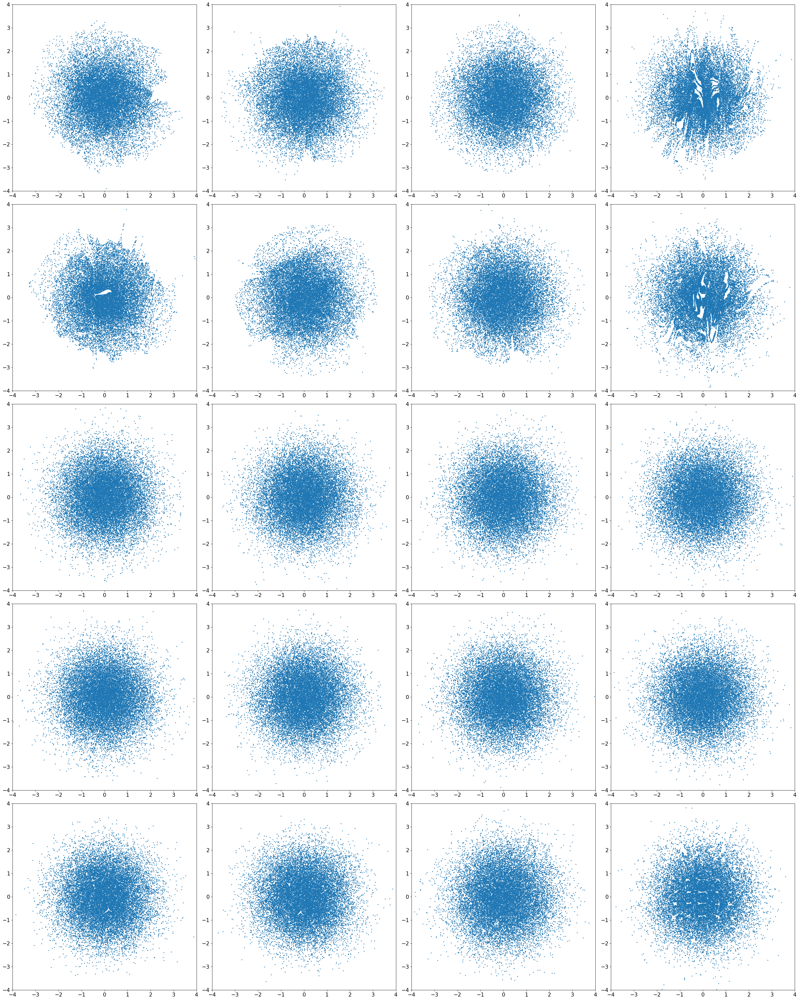

In [132]:
fig, ax = plt.subplots(5,4, figsize=(32,40))
ax[0, 0].scatter(*preimage_realnvp_letters0.T, s=2.)
# ax[0, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
# ax[0, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[0, 0].set_title('RealNVP, 32 Coupling Layers')
ax[0, 1].scatter(*preimage_realnvp_letters40.T, s=2.)
# ax[0, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
# ax[0, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[0, 1].set_title('RealNVP, 32 Coupling Layer')
ax[0, 2].scatter(*preimage_realnvp_checkerboards.T, s=2.)
# ax[0, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
# ax[0, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[0, 2].set_title('RealNVP, 32 Coupling Layers')
ax[0, 3].scatter(*preimage_realnvp_logo.T, s=2.)
# ax[0, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
# ax[0, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[0, 3].set_title('RealNVP, 8 Coupling Layers')


ax[1, 0].scatter(*preimage_realnvp_l2_letters0.T, s=2.)
# ax[1, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
# ax[1, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[1, 0].set_title('RealNVP $+ L_2$, 8 Coupling Layers')
ax[1, 1].scatter(*preimage_realnvp_l2_letters40.T, s=2.)
# ax[1, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
# ax[1, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[1, 1].set_title('RealNVP $+ L_2$, 32 Coupling Layers')
ax[1, 2].scatter(*preimage_realnvp_l2_checkerboards.T, s=2.)
# ax[1, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
# ax[1, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[1, 2].set_title('RealNVP $+ L_2$, 32 Coupling Layers')
ax[1, 3].scatter(*preimage_realnvp_l2_logo.T, s=2.)
# ax[1, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
# ax[1, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[1, 3].set_title('RealNVP $+ L_2$, 12 Coupling Layers')


ax[2, 0].scatter(*preimage_cnf_nol2_letters0.T, s=2.)
# ax[2, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
# ax[2, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[2, 0].set_title('CNF, 3 Vector Fields')
ax[2, 1].scatter(*preimage_cnf_nol2_letters40.T, s=2.)
# ax[2, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
# ax[2, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[2, 1].set_title('CNF, 5 Vector Fields')
ax[2, 2].scatter(*preimage_cnf_nol2_checkerboards.T, s=2.)
# ax[2, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
# ax[2, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[2, 2].set_title('CNF, 5 Vector Fields')
ax[2, 3].scatter(*preimage_cnf_nol2_logo.T, s=2.)
# ax[2, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
# ax[2, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[2, 3].set_title('CNF, 10 Vector Fields')

ax[3, 0].scatter(*preimage_cnf_l2_letters0.T, s=2.)
# ax[3, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
# ax[3, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[3, 0].set_title('CNF $+ L_2$, 5 Vector Fields')
ax[3, 1].scatter(*preimage_cnf_l2_letters40.T, s=2.)
# ax[3, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
# ax[3, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[3, 1].set_title('CNF $+ L_2$, 3 Vector Fields')
ax[3, 2].scatter(*preimage_cnf_l2_checkerboards.T, s=2.)
# ax[3, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
# ax[3, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[3, 2].set_title('CNF $+ L_2$, 5 Vector Fields')
ax[3, 3].scatter(*preimage_cnf_l2_logo.T, s=2.)
# ax[3, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
# ax[3, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[3, 3].set_title('CNF $+ L_2$, 5 Vector Fields')


ax[4, 0].scatter(*preimage_otf_letters0.T, s=2.)
# ax[4, 0].set_xlim((plt_params_letters0['X_MIN'], plt_params_letters0['X_MAX']))
# ax[4, 0].set_ylim((plt_params_letters0['Y_MIN'], plt_params_letters0['Y_MAX']))
# ax[4, 0].set_title('OTF, 5 Potentials')
ax[4, 1].scatter(*preimage_otf_letters40.T, s=2.)
# ax[4, 1].set_xlim((plt_params_letters40['X_MIN'], plt_params_letters40['X_MAX']))
# ax[4, 1].set_ylim((plt_params_letters40['Y_MIN'], plt_params_letters40['Y_MAX']))
# ax[4, 1].set_title('OTF, 5 Potentials')
ax[4, 2].scatter(*preimage_otf_checkerboards.T, s=2.)
# ax[4, 2].set_xlim((plt_params_checkerboards['X_MIN'], plt_params_checkerboards['X_MAX']))
# ax[4, 2].set_xlim((plt_params_checkerboards['Y_MIN'], plt_params_checkerboards['Y_MAX']))
# ax[4, 2].set_title('OTF, 5 Potentials')
ax[4, 3].scatter(*preimage_otf_logo.T, s=2.)
# ax[4, 3].set_xlim((plt_params_logo['X_MIN'], plt_params_logo['X_MAX']))
# ax[4, 3].set_ylim((plt_params_logo['Y_MIN'], plt_params_logo['Y_MAX']))
# ax[4, 3].set_title('OTF, 10 Potentials')

#plt.setp(ax, xlabel='$x_1$ component', ylabel='$x_2$ component');
plt.setp(ax,xlim=(-4,4), ylim=(-4,4));
plt.tight_layout()

In [133]:
fig.savefig('best_models_preimages_20steps.png', bbox_inches='tight')